<a href="https://colab.research.google.com/github/Juacardonaca/SyS2025-II/blob/main/Parcial_2Streamlit.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [38]:
!rm -rf pages    #Para borrar archivos anteriores ya que lo había intentado primero igual de los nombres de la carpeta de Github
!rm -f *.py
!rm -f ./*.py

In [39]:
%%writefile app.py
import streamlit as st
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
import soundfile as sf
import io

#Configuración de página
st.set_page_config(page_title="Parcial 2 🚦", layout="wide")
st.title("Dashboard Interactivo")
st.markdown("Integración de simulación de Audio, Sistemas Mecánicos y Circuitos Eléctricos.")

#Barra lateral, Menú
menu = st.sidebar.radio(
    "Selecciona",
    ("🏠 Inicio",
     "1. Modulación de Audio (AM)",
     "2. Sistema Masa-Resorte (Laplace)",
     "3. Equivalente Eléctrico")
)

if menu == "🏠 Inicio":
    st.title("🚦 Parcial 2: Dashboard Interactivo")
    st.markdown("🎓 Elaborado por: Juan Cardona")
    st.markdown("Estudiante de Ingeniería eléctrica")

    col_intro1, col_intro2 = st.columns([1, 1])

    with col_intro1:
        st.header("Bienvenido")
        st.markdown("""
        Este Dashboard interactivo fue diseñado para la asignatura de Señales y Sistemas.
        Aquí podrás encontrar simulaciones en tiempo real de los siguientes fenómenos físicos:

        * **📻 Punto 1:** Modulación y Demodulación de señales de audio (AM).
        * **⚙️ Punto 2:** Análisis de sistemas mecánicos (Masa-Resorte-Amortiguador) usando Laplace.
        * **⚡ Punto 3:** Circuitos RLC equivalentes y análisis de estabilidad (Polos y Ceros).

        👈 **Selecciona una opción en el menú lateral para comenzar.**
        """)


# PUNTO 1: MODULACIÓN DE AUDIO
if menu == "1. Modulación de Audio (AM)":
    st.header("📻 Punto 1: Modulación AM ")
    st.markdown("Sube un archivo de audio para modularlo con una portadora $cos(2\pi f_c t)$.")

    col1, col2 = st.columns([1, 2])
    with col1:
        uploaded_file = st.file_uploader("Sube tu archivo .wav", type=["wav"])
        fc = st.slider("Frecuencia Portadora (Fc)", 5000, 20000, 15000, step=1000)
        im = st.slider("Índice de Modulación (Im)", 0.1, 2.0, 0.8)
        f_cut = st.slider("Filtro Pasa-Baja (Corte)", 1000, 15000, 8000, step=500)
        start_time = st.number_input("Inicio del corte (s)", value=0.0)
        duration = st.number_input("Duración (s)", value=5.0)

    if uploaded_file is not None:
        with col2:
            xb_raw, fs = sf.read(uploaded_file)
            start_idx = int(start_time * fs)
            end_idx = int((start_time + duration) * fs)

            if len(xb_raw) > end_idx:
                segment = xb_raw[start_idx:end_idx]
                m = np.mean(segment, axis=1) if segment.ndim > 1 else segment
                m = m / np.max(np.abs(m))

                N = len(m)
                t = np.arange(N) / fs
                Ac = 1/im
                c = Ac * np.cos(2 * np.pi * fc * t)
                s = m * c

                # Demodulación
                y_mix = s * c
                Y_mix_fft = np.fft.fft(y_mix)
                freqs = np.fft.fftfreq(len(y_mix), 1/fs)
                mask = np.abs(freqs) < f_cut
                Y_filt = Y_mix_fft * mask
                m_rec = np.fft.ifft(Y_filt).real
                if np.max(np.abs(m_rec)) > 0:
                    m_rec = m_rec / np.max(np.abs(m_rec))

                tab1, tab2, tab3 = st.tabs(["Señales", "Espectros", "Audio"])
                with tab1:
                    fig, ax = plt.subplots(3, 1, figsize=(8, 8), sharex=True)
                    ax[0].plot(t, m, color='blue'); ax[0].set_title("Mensaje")
                    zoom = min(1000, len(t))
                    ax[1].plot(t[:zoom], s[:zoom], color='orange'); ax[1].set_title("Modulada (Zoom)")
                    ax[2].plot(t, m_rec, color='green'); ax[2].set_title("Recuperada")
                    st.pyplot(fig)
                with tab2:
                    fig2, ax2 = plt.subplots(figsize=(8, 4))
                    S_fft = np.fft.fftshift(np.fft.fft(s)/len(s))
                    f_axis = np.fft.fftshift(np.fft.fftfreq(len(s), 1/fs))
                    ax2.plot(f_axis, np.abs(S_fft), color='purple')
                    ax2.set_xlim(-fc*2, fc*2)
                    st.pyplot(fig2)
                with tab3:
                    st.write("Recuperado:"); st.audio(m_rec, sample_rate=fs)
            else:
                st.error("Audio muy corto.")

# PUNTO 2: SISTEMA MASA-RESORTE
elif menu == "2. Sistema Masa-Resorte (Laplace)":
    st.header("⚙️ Punto 2: Sistema Masa-Resorte")
    col1, col2 = st.columns([1, 2])
    with col1:
        m = st.number_input("Masa (kg)", 0.1, 100.0, 1.0)
        c = st.number_input("Amortiguamiento", 0.0, 100.0, 0.5)
        k = st.number_input("Resorte", 0.1, 100.0, 5.0)
        dur = st.slider("Tiempo (s)", 5, 50, 20)
    with col2:
        num, den = [1], [m, c, k]
        sys_m = signal.TransferFunction(num, den)
        t = np.linspace(0, dur, 2000)
        t, y = signal.step(sys_m, T=t)
        fig, ax = plt.subplots()
        ax.plot(t, y, lw=2)
        ax.axhline(1/k, color='r', ls='--')
        ax.set_title("Respuesta al Escalón"); ax.grid(True)
        st.pyplot(fig)

        wn = np.sqrt(k/m)
        zeta = c / (2 * np.sqrt(k*m))
        st.info(f"Frecuencia: {wn:.2f} rad/s | Zeta: {zeta:.3f}")

# PUNTO 3: EQUIVALENTE ELÉCTRICO
elif menu == "3. Equivalente Eléctrico":
    st.header("⚡ Punto 3: Equivalente Eléctrico")
    caso = st.selectbox("Caso:", ("Subamortiguado", "Crítico", "Sobreamortiguado"))
    lazo = st.radio("Lazo:", ("Abierto", "Cerrado"))

    m, k = 1.0, 1.0
    if "Sub" in caso: c = 0.5; color='blue'
    elif "Crít" in caso: c = 2.0; color='green'
    else: c = 5.0; color='orange'

    L, C, R = m, 1/k, (m*k)/c
    st.write(f"**Equivalentes:** L={L}H, C={C}F, R={R:.2f}Ω")

    wn2, att = 1/(L*C), 1/(R*C)
    num, den = [wn2], [1, att, wn2]
    if lazo == "Cerrado": den[-1] += num[0]

    sys_e = signal.TransferFunction(num, den)

    c1, c2 = st.columns(2)
    with c1:
        fig1, ax1 = plt.subplots()
        ax1.scatter(np.real(sys_e.poles), np.imag(sys_e.poles), marker='x', s=100, color='r')
        ax1.grid(True); ax1.set_title("Polos y Ceros")
        st.pyplot(fig1)
    with c2:
        w, mag, _ = signal.bode(sys_e)
        fig2, ax2 = plt.subplots()
        ax2.semilogx(w, mag, color=color)
        ax2.grid(True); ax2.set_title("Bode")
        st.pyplot(fig2)

    t = np.linspace(0, 20, 1000)
    t, y = signal.step(sys_e, T=t)
    st.line_chart(pd.DataFrame({'Tiempo':t, 'Amplitud':y}).set_index('Tiempo'))
    import pandas as pd # Aseguramos pandas para el line_chart final

Writing app.py


In [40]:
# 1. Instalamos las librerías necesarias
!pip install streamlit soundfile scipy matplotlib pandas

# 2. Descargamos Cloudflared (Tu código)
!wget https://github.com/cloudflare/cloudflared/releases/latest/download/cloudflared-linux-amd64
!chmod +x cloudflared-linux-amd64
!mv cloudflared-linux-amd64 /usr/local/bin/cloudflared

# 3. Ejecutamos Streamlit en segundo plano (OJO: aquí cambié el nombre a app.py)
!streamlit run app.py &>/content/logs.txt &

# 4. Exponemos el puerto 8501 con Cloudflare Tunnel
!cloudflared tunnel --url http://localhost:8501 > /content/cloudflared.log 2>&1 &

# 5. Leemos la URL pública generada (Tu código)
import time
import re

print("⏳ Esperando a que se genere el túnel (aprox 10 segundos)...")
time.sleep(10)  # Le damos un poco más de tiempo para asegurar

found_context = False
url_encontrada = None

try:
    with open('/content/cloudflared.log') as f:
        for line in f:
            if "trycloudflare.com" in line: # Buscamos cualquier link de cloudflare
                match = re.search(r'https?://\S+\.trycloudflare\.com', line)
                if match:
                    url_encontrada = match.group(0)
                    break
except FileNotFoundError:
    print("El archivo de log aún no existe.")

if url_encontrada:
    print(f'\n🚀 ¡Tu aplicación está lista! Haz clic aquí: {url_encontrada}')
else:
    print("\n⚠️ No se encontró la URL automáticamente.")
    print("Intenta ejecutar la siguiente línea para ver el log completo y buscar el link manualmente:")
    print("!cat /content/cloudflared.log")

--2025-12-03 04:44:48--  https://github.com/cloudflare/cloudflared/releases/latest/download/cloudflared-linux-amd64
Resolving github.com (github.com)... 140.82.113.3
Connecting to github.com (github.com)|140.82.113.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://github.com/cloudflare/cloudflared/releases/download/2025.11.1/cloudflared-linux-amd64 [following]
--2025-12-03 04:44:48--  https://github.com/cloudflare/cloudflared/releases/download/2025.11.1/cloudflared-linux-amd64
Reusing existing connection to github.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://release-assets.githubusercontent.com/github-production-release-asset/106867604/955e9d1b-ac5e-4188-8867-e5f53958a8fe?sp=r&sv=2018-11-09&sr=b&spr=https&se=2025-12-03T05%3A35%3A12Z&rscd=attachment%3B+filename%3Dcloudflared-linux-amd64&rsct=application%2Foctet-stream&skoid=96c2d410-5711-43a1-aedd-ab1947aa7ab0&sktid=398a6654-997b-47e9-b12b-9515b896b4de&skt=2025-12-03

#Punto 1

In [41]:
# Primero instalamos la canción de youtube
!python3 -m pip install --force-reinstall https://github.com/yt-dlp/yt-dlp/archive/master.tar.gz

     - 2.9 MB 10.3 MB/s 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for yt-dlp: filename=yt_dlp-2025.11.12-py3-none-any.whl size=3036126 sha256=dc9dfdc6dee89d2cf8badc52190b751dcebf2a87593467d9af4bf4e8363d959d
  Stored in directory: /tmp/pip-ephem-wheel-cache-43ui19bb/wheels/b6/70/13/8d2d11b326f983030b72df6408392d5c1b3bc27a9db8b7c5b0
Successfully built yt-dlp


In [42]:
from google.colab import files
import shutil, os

print("Selecciona el archivo .txt de cookies exportado desde tu navegador (ej: youtube.com_cookies.txt).")
uploaded = files.upload()

if not uploaded:
    print("No se subió ningún archivo.")
else:
    # toma el primer archivo subido
    original_name = next(iter(uploaded))
    dest = "/content/cookies_yt.txt"
    # si ya existe, lo sobreescribimos
    if os.path.exists(dest):
        os.remove(dest)
    shutil.move(original_name, dest)
    print(f"Archivo subido y guardado como: {dest}")
    print("Contenido (primeras 5 líneas) — para confirmar formato:")
    with open(dest, "r", errors="ignore") as f:
        for i, line in enumerate(f):
            if i >= 5: break
            print(line.rstrip())

Selecciona el archivo .txt de cookies exportado desde tu navegador (ej: youtube.com_cookies.txt).


Saving www.youtube.com_cookies.txt to www.youtube.com_cookies.txt
Archivo subido y guardado como: /content/cookies_yt.txt
Contenido (primeras 5 líneas) — para confirmar formato:
# Netscape HTTP Cookie File
# https://curl.haxx.se/rfc/cookie_spec.html
# This is a generated file! Do not edit.

.youtube.com	TRUE	/	TRUE	1764708110	GPS	1


In [43]:
link1="https://www.youtube.com/watch?v=a1Femq4NPxs"
!yt-dlp --extract-audio -o "audio" --audio-format mp3 --force-overwrites --cookies cookies_yt.txt {link1}

[youtube] Extracting URL: https://www.youtube.com/watch?v=a1Femq4NPxs
[youtube] a1Femq4NPxs: Downloading webpage
[youtube] a1Femq4NPxs: Downloading tv downgraded player API JSON
[youtube] a1Femq4NPxs: Downloading web safari player API JSON
[youtube] a1Femq4NPxs: Downloading m3u8 information
[info] a1Femq4NPxs: Downloading 1 format(s): 96
[download] Sleeping 15.00 seconds as required by the site...
[hlsnative] Downloading m3u8 manifest
[hlsnative] Total fragments: 68
[download] Destination: audio
[download] 100% of  108.12MiB in 00:00:03 at 32.09MiB/s
[FixupM3u8] Fixing MPEG-TS in MP4 container of "audio"
[ExtractAudio] Destination: audio.mp3
Deleting original file audio (pass -k to keep)


In [44]:
!ffmpeg -y -i audio.mp3 output2.wav

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [45]:
from google.colab import files
import os
#Vamos a descargar el archivo para ensayarlo en el dashboard
# Verificamos si existe antes de intentar bajarlo
if os.path.exists('output2.wav'):
    files.download('output2.wav')
    print("✅ Descargando archivo...")
else:
    print("⚠️ No encontré el archivo 'output2.wav'. Asegúrate de haber corrido el código del principio que descarga el audio de YouTube.")

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

✅ Descargando archivo...


In [46]:
!pip install soundfile

In [47]:
import soundfile as sf # para instalar pip install soundfile
#lee archivos wav
nombre_out2 = "output2.wav"
xb, fs2 = sf.read(nombre_out2)
# read speech signal from file
print('Frecuencia de muestreo %.2f[Hz]\naudio %s' % (fs2,nombre_out2))

Frecuencia de muestreo 44100.00[Hz]
audio output2.wav


In [48]:
from IPython.display import Audio
ns2 = 60 #se reproducen los primeros ns segundos
Audio(xb[:int(fs2*ns2),:].T,rate=fs2)

In [49]:
from IPython.display import Audio
ns2 = 5 #se reproducen los ns segundos
Audio(xb[int(fs2*3):int(fs2*(3+ns2)),:].T,rate=fs2) #Modifiqué el vector de tiempo, para que empezara a los 3 segundos que es donde empieza el cantante, y a partir de esos 3 segundos le sumé los segundos que quería que se reproduciera

Amplitud de la portadora (Ac): 1.25


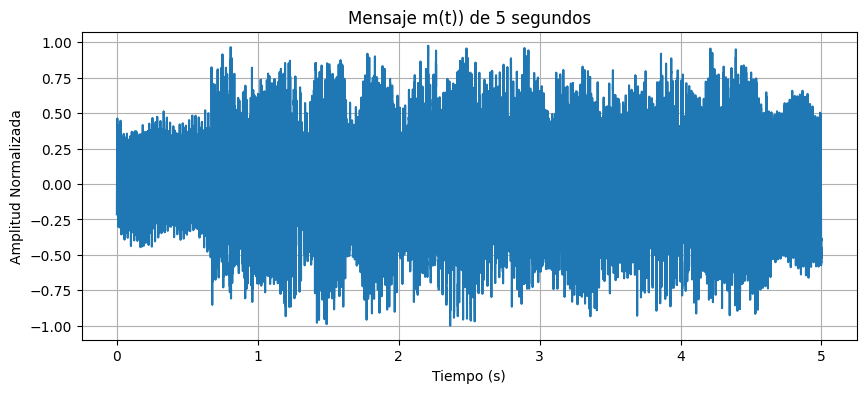

segmento de audio


In [50]:
import numpy as np
import matplotlib.pyplot as plt
import soundfile as sf #leer el archivo de audio
import IPython.display as ipd #Para reproducir audio

nombre_out2 = "output2.wav"
xb_raw, fs2 = sf.read(nombre_out2) #xb_raw para el audio completo

# Extraemos el segmento de audio para el procesamiento
segmento_audio = xb_raw[int(fs2*3):int(fs2*(3+ns2)), :].copy()

#Convertir a MONO
if segmento_audio.shape[1] > 1:
    # Promediamos los canales izquierdo y derecho
    m = np.mean(segmento_audio, axis=1)
else:
    m = segmento_audio.flatten()

# Normalizamos la señal 'm' para que su valor máximo sea 1
m = m / np.max(np.abs(m))

Fs = fs2  #Frecuencia de muestreo
N = len(m) # Número total de muestras en el segmento
t = np.arange(N) / Fs # Vector de tiempo para el segmento de audio

Fc = 15000 # Frecuencia de portadora ajustada, la portadora debe tener una #frecuencia mayor que el mensaje para no generar clipping que es la distorsión #de la señal
# de audio que ocurre cuando la amplitud de la señal excede la capacidad
# máxima que un equipo de audio puede manejar

# Amplitud del mensaje (como normalizamos 'm', su amplitud pico es 1)
Am = 1

# Índice de modulación deseado
Im = 0.8

# Calculamos la amplitud de la portadora Ac
# Ac = peak(m(t)) / Im. Como peak(m(t)) es 1:
Ac = 1 / Im
print(f"Amplitud de la portadora (Ac): {Ac:.2f}")

# Generamos la señal portadora
c = Ac * np.cos(2 * np.pi * Fc * t)

plt.figure(figsize=(10, 4))
plt.plot(t, m)
plt.title(f"Mensaje m(t)) de {5} segundos")
plt.xlabel("Tiempo (s)")
plt.ylabel("Amplitud Normalizada")
plt.grid(True)
plt.show()

print(f"segmento de audio") #Para corroborar que está tomando en cuenta la canción
ipd.display(ipd.Audio(m, rate=Fs)) # Ahora 'm' es el segmento ya procesado

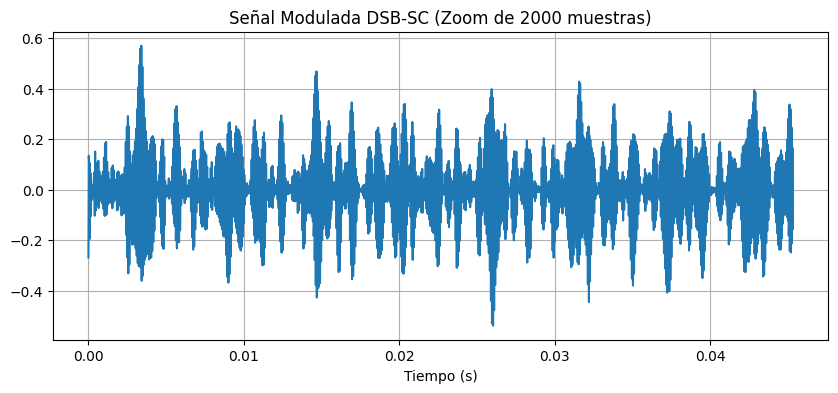

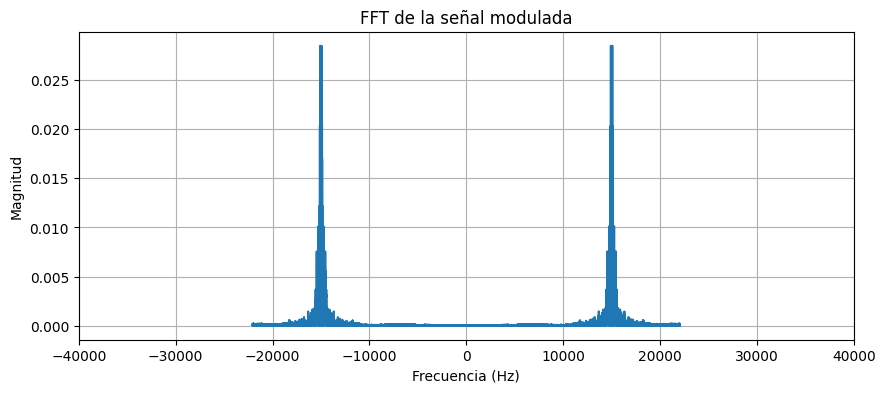

In [51]:
# Señal modulada
s = m * c   # s(t) = m(t) * Ac cos(2πFc t)

zoom = 2000
plt.figure(figsize=(10,4))
plt.plot(t[:zoom], s[:zoom])
plt.title("Señal Modulada DSB-SC (Zoom de 2000 muestras)")
plt.xlabel("Tiempo (s)")
plt.grid(True)
plt.show()

# FFT para ver el espectro
S = np.fft.fftshift(np.fft.fft(s) / len(s))
freqs = np.fft.fftshift(np.fft.fftfreq(len(s), 1/Fs))

plt.figure(figsize=(10,4))
plt.plot(freqs, np.abs(S))
plt.title("FFT de la señal modulada")
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Magnitud")
plt.grid(True)
plt.xlim(-40000, 40000)  # Ajustado a Fc=15k
plt.show()


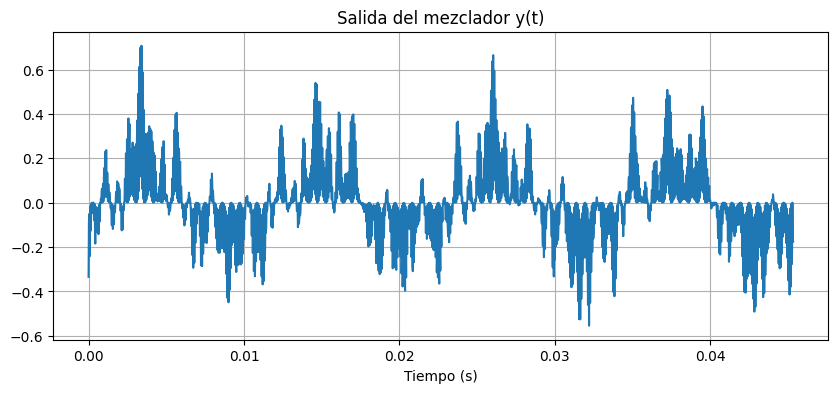

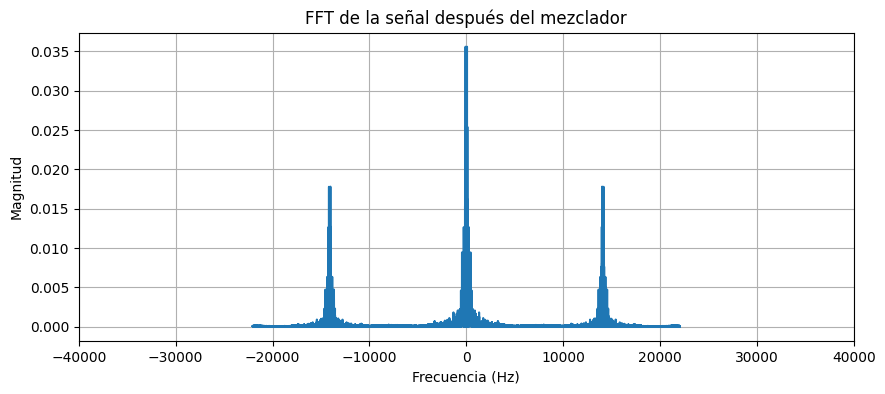

In [52]:
#MEZCLADOR que es multiplicar por la portadora
y = s * c   # Se multiplica de nuevo por la misma portadora

# Graficar zoom temporal
plt.figure(figsize=(10,4))
plt.plot(t[:zoom], y[:zoom])
plt.title("Salida del mezclador y(t)")
plt.xlabel("Tiempo (s)")
plt.grid(True)
plt.show()

# FFT
Y = np.fft.fftshift(np.fft.fft(y) / len(y))

plt.figure(figsize=(10,4))
plt.plot(freqs, np.abs(Y))
plt.title("FFT de la señal después del mezclador")
plt.xlabel("Frecuencia (Hz)")
plt.ylabel("Magnitud")
plt.grid(True)
plt.xlim(-40000, 40000)
plt.show()


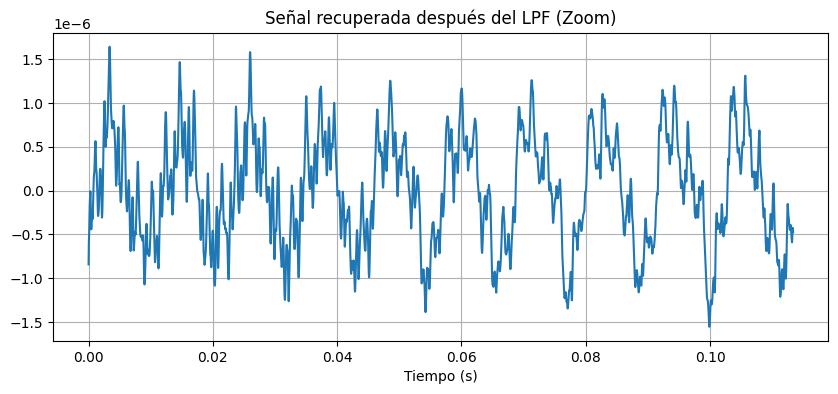

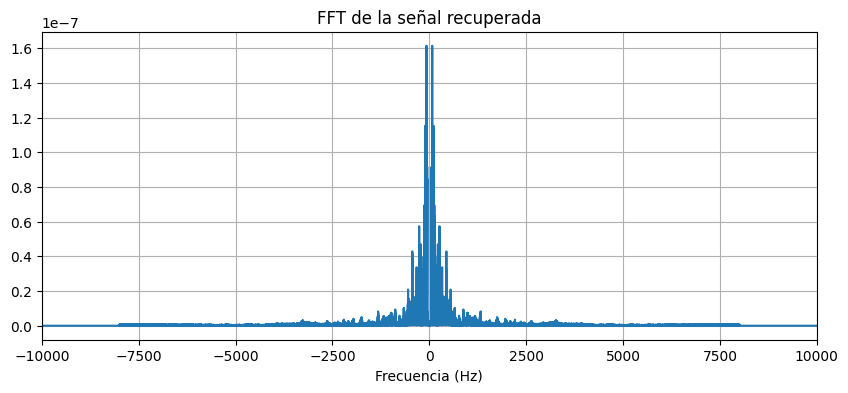

In [53]:
#FILTRO PASA BAJA
f_cut = 8000  # Frecuencia de corte del filtro pasa bajas

# Creamos máscara del filtro ideal
mask = np.abs(freqs) <= f_cut

# Aplicamos la máscara
Y_filt = Y * mask

# Antitransformada para recuperar el audio
m_rec = np.fft.ifft(np.fft.ifftshift(Y_filt)).real

# Señal recuperada
plt.figure(figsize=(10,4))
plt.plot(t[:5000], m_rec[:5000])
plt.title("Señal recuperada después del LPF (Zoom)")
plt.xlabel("Tiempo (s)")
plt.grid(True)
plt.show()

# FFT recuperada
M_rec = np.fft.fftshift(np.fft.fft(m_rec) / len(m_rec))

plt.figure(figsize=(10,4))
plt.plot(freqs, np.abs(M_rec))
plt.title("FFT de la señal recuperada")
plt.xlabel("Frecuencia (Hz)")
plt.grid(True)
plt.xlim(-10000, 10000)
plt.show()


In [54]:
#Escalamiento final y reproducción del audio
m_rec = (2/Ac) * m_rec    # compensación
m_rec = m_rec / np.max(np.abs(m_rec))  # normalizar audio

ipd.Audio(m_rec, rate=Fs)


#Punto 2

<>:38: SyntaxWarning: invalid escape sequence '\z'
<>:38: SyntaxWarning: invalid escape sequence '\o'
<>:55: SyntaxWarning: invalid escape sequence '\s'
<>:56: SyntaxWarning: invalid escape sequence '\o'
<>:38: SyntaxWarning: invalid escape sequence '\z'
<>:38: SyntaxWarning: invalid escape sequence '\o'
<>:55: SyntaxWarning: invalid escape sequence '\s'
<>:56: SyntaxWarning: invalid escape sequence '\o'
/tmp/ipython-input-2065662093.py:38: SyntaxWarning: invalid escape sequence '\z'
  plt.title(f'Respuesta al Escalón (Suave)\n$\zeta$={zeta:.2f}, $\omega_n$={wn:.2f}')
/tmp/ipython-input-2065662093.py:38: SyntaxWarning: invalid escape sequence '\o'
  plt.title(f'Respuesta al Escalón (Suave)\n$\zeta$={zeta:.2f}, $\omega_n$={wn:.2f}')
/tmp/ipython-input-2065662093.py:55: SyntaxWarning: invalid escape sequence '\s'
  plt.xlabel('Eje Real ($\sigma$)')
/tmp/ipython-input-2065662093.py:56: SyntaxWarning: invalid escape sequence '\o'
  plt.ylabel('Eje Imaginario ($j\omega$)')


Sistema: m=1.0, c=0.5, k=5.0

--- Análisis de Polos y Ceros ---
Polos: [-0.25+2.2220486j -0.25-2.2220486j]
Ceros: []
Frecuencia natural (wn): 2.24 rad/s
Factor de amortiguamiento (zeta): 0.112


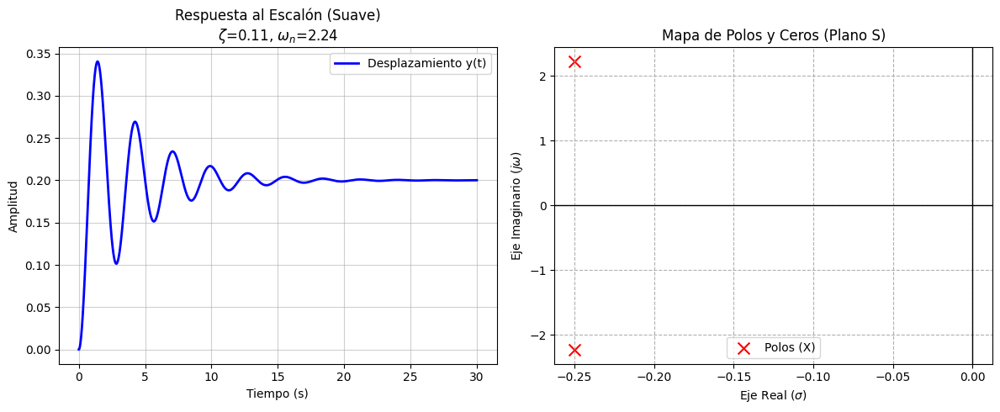

In [55]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

m = 1.0   # Masa (kg)
c = 0.5   # Amortiguamiento
k = 5.0   # Resorte

print(f"Sistema: m={m}, c={c}, k={k}")

# H(s) = 1 / (ms^2 + cs + k) función de transferencia
num = [1]
den = [m, c, k]
sistema = signal.TransferFunction(num, den)

#Polos y Ceros
polos = sistema.poles
ceros = sistema.zeros

print("\n--- Análisis de Polos y Ceros ---")
print(f"Polos: {polos}")
print(f"Ceros: {ceros}")

# Frecuencia natural y amortiguamiento
wn = np.sqrt(k/m)
zeta = c / (2 * np.sqrt(k*m))
print(f"Frecuencia natural (wn): {wn:.2f} rad/s")
print(f"Factor de amortiguamiento (zeta): {zeta:.3f}")

t_suave = np.linspace(0, 30, 2000) #Simulación con alta resolución para ver una onda mucho más suave
t, y = signal.step(sistema, T=t_suave)

plt.figure(figsize=(12, 5))

# Respuesta en el tiempo
plt.subplot(1, 2, 1)
plt.plot(t, y, label='Desplazamiento y(t)', color='blue', linewidth=2)
plt.title(f'Respuesta al Escalón (Suave)\n$\zeta$={zeta:.2f}, $\omega_n$={wn:.2f}')
plt.xlabel('Tiempo (s)')
plt.ylabel('Amplitud')
plt.grid(True, alpha=0.6)
plt.legend()

# Polos y ceroz
plt.subplot(1, 2, 2)
plt.scatter(np.real(polos), np.imag(polos), marker='x', s=100, color='red', label='Polos (X)')
#En este caso no hay ceros
if len(ceros) > 0:
    plt.scatter(np.real(ceros), np.imag(ceros), marker='o', s=100, color='green', label='Ceros (O)')

# Ejes del plano complejo
plt.axhline(0, color='black', linewidth=1) # Eje Real
plt.axvline(0, color='black', linewidth=1) # Eje Imaginario
plt.title('Mapa de Polos y Ceros (Plano S)')
plt.xlabel('Eje Real ($\sigma$)')
plt.ylabel('Eje Imaginario ($j\omega$)')
plt.grid(True, linestyle='--')
plt.legend()

plt.tight_layout()
plt.show()

#Punto 3

<>:95: SyntaxWarning: invalid escape sequence '\z'
<>:95: SyntaxWarning: invalid escape sequence '\z'
/tmp/ipython-input-4133503179.py:95: SyntaxWarning: invalid escape sequence '\z'
  analizar_sistema(num, den, f"{caso['nombre']} ($\zeta$={zeta:.2f})", caso["color"])


analisis de sistema

>>> CASO: SUB-AMORTIGUADO (Lazo Abierto)
    Mecánico: m=1.0, k=1.0, c=0.3 | Zeta=0.15
    Eléctrico Equiv: L=1.0H, C=1.0F, R=3.33 Ohms


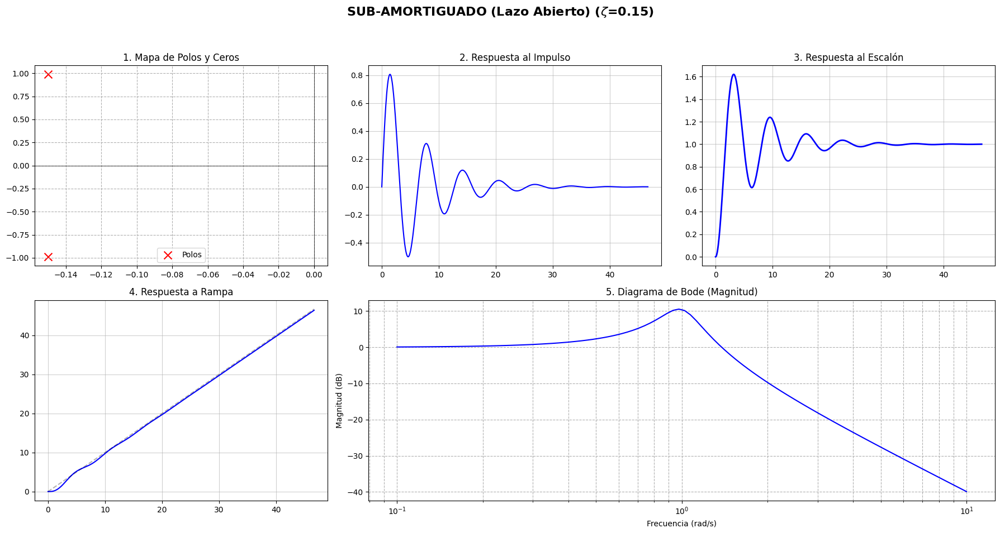

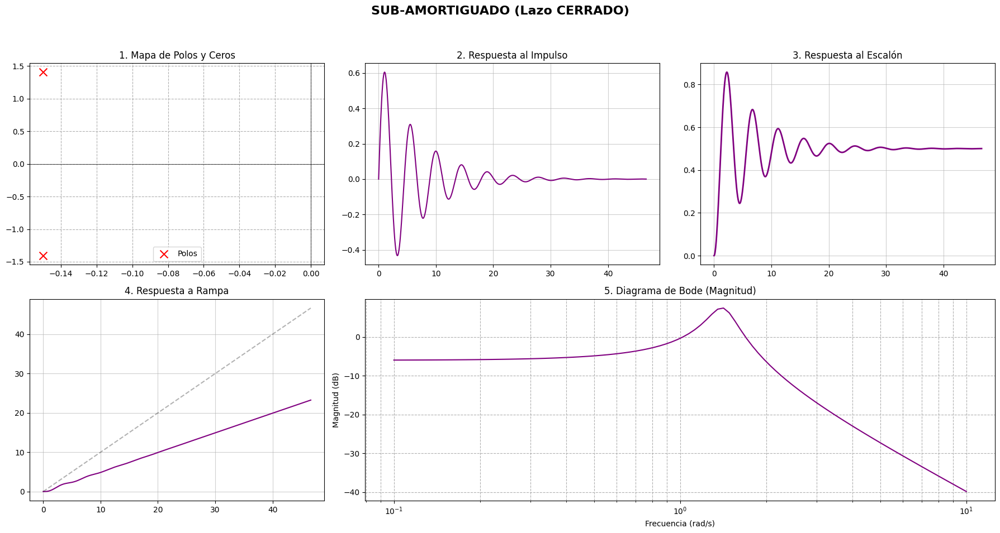


>>> CASO: CRÍTICAMENTE AMORTIGUADO (Lazo Abierto)
    Mecánico: m=1.0, k=1.0, c=2.0 | Zeta=1.00
    Eléctrico Equiv: L=1.0H, C=1.0F, R=0.50 Ohms


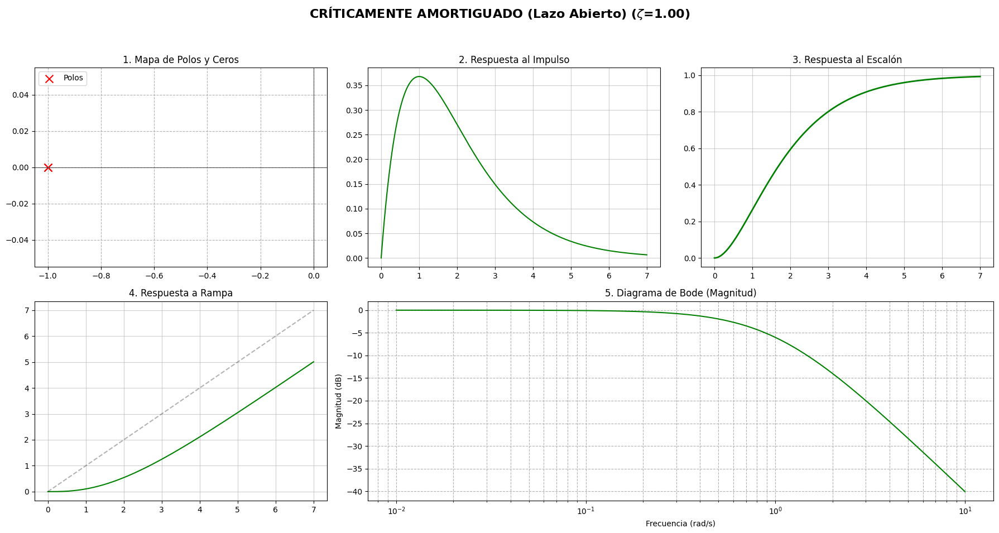

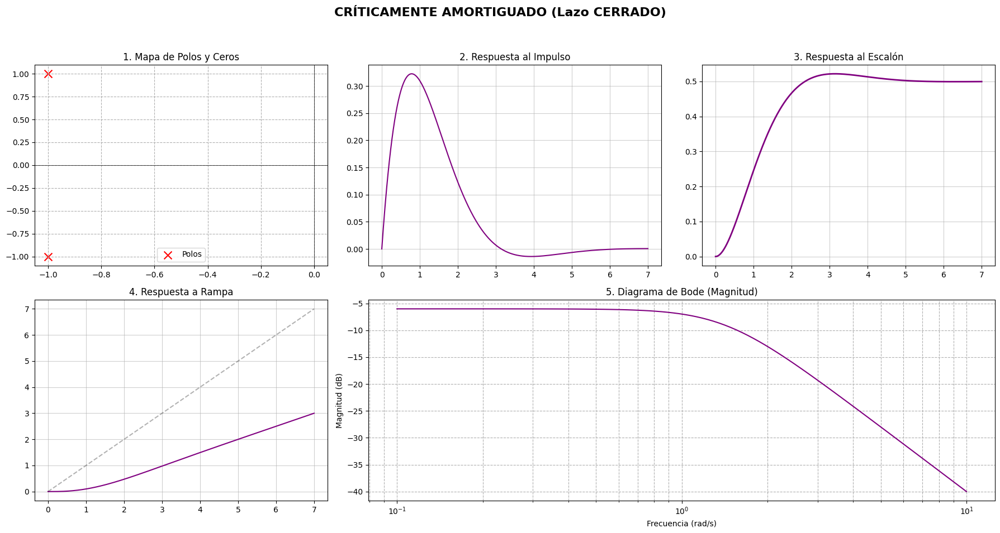


>>> CASO: SOBRE-AMORTIGUADO (Lazo Abierto)
    Mecánico: m=1.0, k=1.0, c=5.0 | Zeta=2.50
    Eléctrico Equiv: L=1.0H, C=1.0F, R=0.20 Ohms


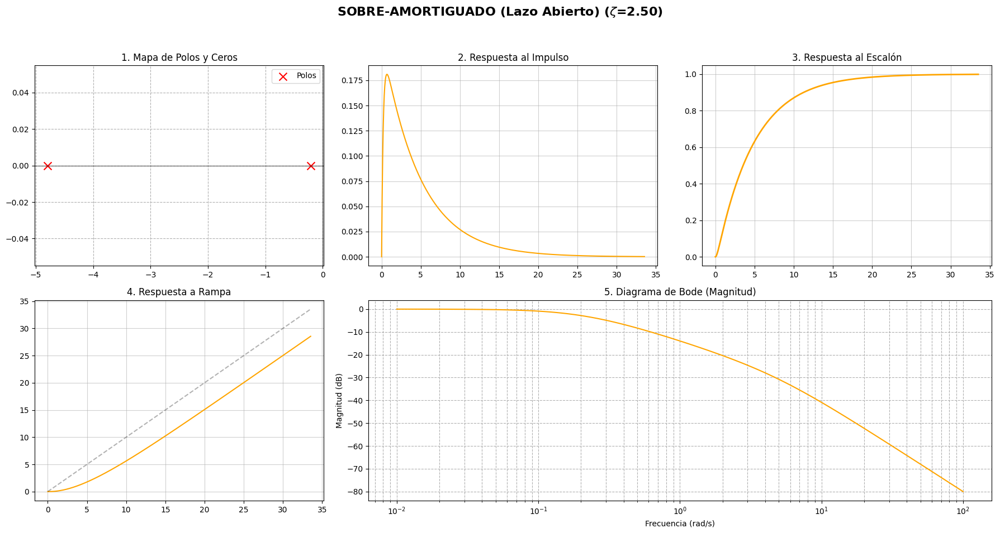

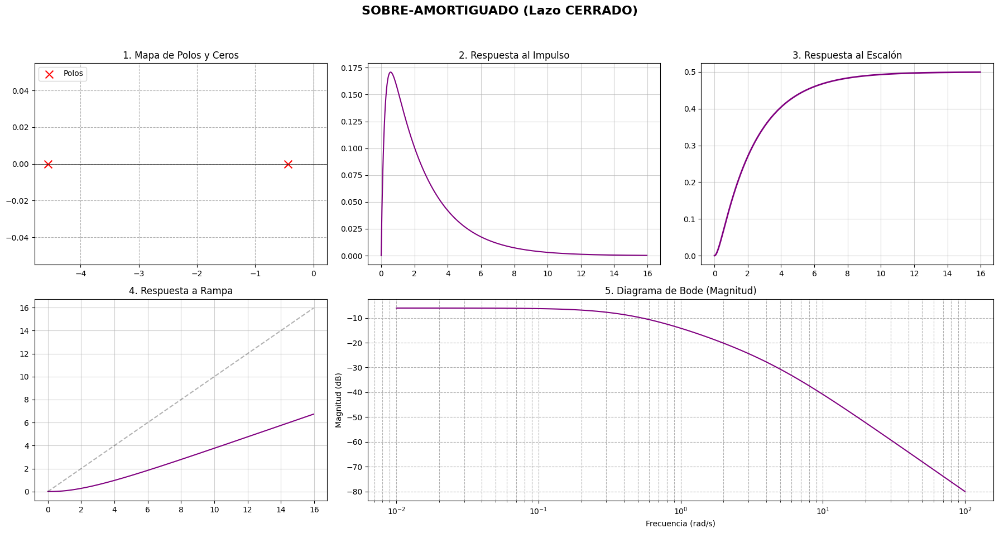

In [56]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

def analizar_sistema(num, den, titulo, color_base): # Para generar gráficos y ahorrar líneas de ejecución para cada uno de los sistemas
    sistema = signal.TransferFunction(num, den)

    fig = plt.figure(figsize=(18, 10))
    fig.suptitle(titulo, fontsize=16, fontweight='bold')

    #Polos y Ceros
    ax1 = fig.add_subplot(2, 3, 1)
    polos = sistema.poles
    ceros = sistema.zeros
    ax1.scatter(np.real(polos), np.imag(polos), marker='x', s=100, color='red', label='Polos')
    if len(ceros) > 0:
        ax1.scatter(np.real(ceros), np.imag(ceros), marker='o', s=100, color='green', label='Ceros')
    ax1.axhline(0, color='black', lw=0.5); ax1.axvline(0, color='black', lw=0.5)
    ax1.set_title("1. Mapa de Polos y Ceros")
    ax1.grid(True, linestyle='--')
    ax1.legend()

    #Respuesta al Impulso
    ax2 = fig.add_subplot(2, 3, 2)
    t_imp, y_imp = signal.impulse(sistema, N=1000)
    ax2.plot(t_imp, y_imp, color=color_base)
    ax2.set_title("2. Respuesta al Impulso")
    ax2.grid(True, alpha=0.6)

    #Respuesta al Escalón
    ax3 = fig.add_subplot(2, 3, 3)
    t_step, y_step = signal.step(sistema, N=1000)
    ax3.plot(t_step, y_step, color=color_base, lw=2)
    ax3.set_title("3. Respuesta al Escalón")
    ax3.grid(True, alpha=0.6)

    # Respuesta a la Rampa (Respuesta al escalón de sistema/s)
    ax4 = fig.add_subplot(2, 3, 4)
    # Multiplicamos denominador por s (añadimos un polo en 0)
    den_rampa = np.concatenate([den, [0]])
    sistema_rampa = signal.TransferFunction(num, den_rampa)
    t_ramp, y_ramp = signal.step(sistema_rampa, T=np.linspace(0, t_step[-1], 1000))
    ax4.plot(t_ramp, y_ramp, color=color_base)
    ax4.plot(t_ramp, t_ramp, 'k--', alpha=0.3, label='Referencia Rampa') # Línea de referencia
    ax4.set_title("4. Respuesta a Rampa")
    ax4.grid(True, alpha=0.6)

    #Diagrama de Bode
    ax5 = fig.add_subplot(2, 3, (5, 6)) # Ocupa 2 espacios
    w, mag, phase = signal.bode(sistema)
    ax5.semilogx(w, mag, color=color_base)
    ax5.set_title("5. Diagrama de Bode (Magnitud)")
    ax5.set_xlabel("Frecuencia (rad/s)")
    ax5.set_ylabel("Magnitud (dB)")
    ax5.grid(True, which="both", linestyle='--')

    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

# Fijamos Masa y Resorte constantes, variamos Amortiguamiento (c)
m = 1.0  # kg
k = 1.0  # N/m
# c_critico = 2 * sqrt(m*k) = 2 * 1 = 2

casos = [
    {"nombre": "SUB-AMORTIGUADO (Lazo Abierto)", "c": 0.3, "color": "blue"},   # Zeta < 1
    {"nombre": "CRÍTICAMENTE AMORTIGUADO (Lazo Abierto)", "c": 2.0, "color": "green"}, # Zeta = 1
    {"nombre": "SOBRE-AMORTIGUADO (Lazo Abierto)", "c": 5.0, "color": "orange"} # Zeta > 1
]

print("analisis de sistema")

for caso in casos:
    c = caso["c"]

    #Equivalencia Eléctrica (Asumiendo L = m)
    L = m
    C = 1.0 / k
    R = (m * k) / c

    #Función de Transferencia Mecánica / Eléctrica (Son la misma estructura)
    # G(s) = (1/LC) / (s^2 + (1/RC)s + (1/LC))
    wn2 = 1.0 / (L * C)       # omega_n al cuadrado
    att = 1.0 / (R * C)       # 2*zeta*omega_n

    num = [wn2]
    den = [1, att, wn2]

    zeta = c / (2 * np.sqrt(k*m))
    print(f"\n>>> CASO: {caso['nombre']}")
    print(f"    Mecánico: m={m}, k={k}, c={c} | Zeta={zeta:.2f}")
    print(f"    Eléctrico Equiv: L={L}H, C={C}F, R={R:.2f} Ohms")

    #Graficar Lazo Abierto
    analizar_sistema(num, den, f"{caso['nombre']} ($\zeta$={zeta:.2f})", caso["color"])

    #Lazo Cerrado (Feedback unitario)
    # T(s) = G(s) / (1 + G(s))
    # Para sistemas de segundo orden tipo 1/ (s^2 + As + B),
    # el lazo cerrado convierte el denominador en: s^2 + As + (B + 1)
    # Usamos la función feedback de scipy
    sys_open = signal.TransferFunction(num, den)

    # Feedback (suponiendo numerador=1 en el bloque de retroalimentación)
    num_cl = num
    den_cl = [den[0], den[1], den[2] + num[0]] # Sumamos num al término independiente del den

    analizar_sistema(num_cl, den_cl, f"{caso['nombre'].replace('Abierto', 'CERRADO')}", "purple")